In [1]:
import pandas as pd
import numpy as np
import urllib.request
import datetime
from os.path import join
import xarray as xr
from glob import glob
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpltPath
from shapely.geometry import Polygon
from collections import Counter
from scipy.ndimage.filters import gaussian_filter
import scipy
import seaborn as sns
import numpy as np
import warnings
from IPython.display import Image, display
warnings.filterwarnings('ignore')
sns.set(font_scale = 2)
import dask
from dask.distributed import Client, LocalCluster
from dask_jobqueue import PBSCluster
from hwtmode.evaluation import hazard_cond_prob
import joblib
import os
from hwtmode.data import load_labels, load_probabilities
from hwtmode.process import generate_obs_grid

In [2]:
def plot_total_cp(reports, preds, model_name, neighborhood_thresh=0.1, ax=0):
    
    df = pd.DataFrame(columns=['Storm Mode', 'Hazard', 'Cond Prob'])
    i=0
    for hazard in ['Tornado', 'Hail', 'Wind']:
        for mode in ['Supercell', 'QLCS', 'Disorganized']:
            cp = hazard_cond_prob(reports, preds, model_name, hazard, mode, neighborhood_thresh)
            df.loc[i] = [mode, hazard, cp]
            i += 1
            
    # plt.figure(figsize=(16,10))
    sns.barplot(hue='Hazard', y='Cond Prob', x='Storm Mode', data=df, palette=['r','g','b'], ax=ax)
    ax.set_ylim(0, 0.052)
    ax.set_ylabel('Conditional Probability', fontsize=18)
    # plt.savefig(f'/glade/work/cbecker/HWT_val_output/{model_name}_cond_prob_2016.png', dpi=300, bbox_inches='tight')
    return

def plot_rel_diagram_neighborhood(reports, preds, model_name, bin_width, bin_max=0.36, ax=0): 
    
    df = pd.DataFrame(columns=['Storm Mode', 'Hazard', 'Cond Prob', 'Neighborhood Prob'])
    i=0

    for hazard in ['Tornado', 'Hail', 'Wind']:
        for mode in ['Supercell', 'QLCS']:
            for nproby in np.arange(0.0, bin_max, bin_width):
                cp = hazard_cond_prob(reports, preds, model_name, hazard, mode, nproby, nproby + bin_width)
                df.loc[i] = [mode, hazard, cp, nproby]
                i += 1
    df['Cond Prob'].replace(0, np.nan, inplace=True)
    
    # plt.figure(figsize=(16,10))
    for j, hazard in enumerate(['Tornado', 'Hail', 'Wind']):
        for mode in ['Supercell', 'QLCS']:
            if mode == 'Supercell':
                ltype = ['r-o', 'g-o', 'b-o']
            elif mode == 'QLCS':
                ltype = ['r--o', 'g--o', 'b--o']
            df_sub = df.loc[(df['Storm Mode'] == mode) & (df['Hazard'] == hazard)]
            ax.plot(df_sub['Neighborhood Prob'], df_sub['Cond Prob'], ltype[j], label=f'{hazard.capitalize()} | {mode}')
            ax.set_ylim(0, 0.12)
            ax.set_xlim(0, bin_max)
            ax.set_xlabel('Neighborhood Probability', fontsize=22)
            ax.set_ylabel('Conditional Probability', fontsize=18)
        ax.legend(loc='upper left')
    # plt.savefig(f'/glade/work/cbecker/HWT_val_output/{model_name}_nprob_2016.png', dpi=300, bbox_inches='tight')
    return

def plot_rel_diagram_ML_prob(reports, preds, model_name, bin_width, nprob_thresh=0.02): 
    
    df = pd.DataFrame(columns=['Storm Mode', 'Hazard', 'Cond Prob', 'ML Prob'])
    i=0
    
    for hazard in ['torn', 'hail', 'wind']:
        for mode in ['Supercell', 'QLCS']:
            for ml_bin in np.arange(0, 1, bin_width):
                mask = xr.where((preds[f'{model_name}_{mode}_prob'] > ml_bin) & (preds[f'{model_name}_{mode}_prob'] <= ml_bin + bin_width), 1, 0)
                ds = preds.where(mask)
                cp = hazard_cond_prob(reports, ds, model_name, hazard, mode, nprob_thresh)
                df.loc[i] = [mode, hazard, cp, f'{np.round(ml_bin, 1)}-{np.round(ml_bin + bin_width, 1)}']
                i += 1
    df['Cond Prob'].replace(0, np.nan, inplace=True)
    
    plt.figure(figsize=(16,10))
    for j, hazard in enumerate(['torn', 'hail', 'wind']):
        for mode in ['Supercell', 'QLCS']:
            if mode == 'Supercell':
                ltype = ['r-o', 'g-o', 'b-o']
            elif mode == 'QLCS':
                ltype = ['r--o', 'g--o', 'b--o']
            df_sub = df.loc[(df['Storm Mode'] == mode) & (df['Hazard'] == hazard)]
            plt.plot(df_sub['ML Prob'], df_sub['Cond Prob'], ltype[j], label=f'{hazard.capitalize()} | {mode}')
            # plt.ylim(0, 0.03)
            # plt.xlim(0, 100)
            plt.xlabel('ML Probability', fontsize=18)
            plt.ylabel('Conditional Probability', fontsize=18)
        plt.legend()
    # plt.savefig(f'/glade/work/cbecker/HWT_val_output/{model_name}_ML_prob_2016.png', dpi=300, bbox_inches='tight')
    return

def plot_modes_spatial(labels, model_name, ax=0):
    
    # fig = plt.figure(figsize=(40, 20), constrained_layout=True)
    # lcc = ccrs.LambertConformal(central_longitude=-97.5, standard_parallels=(38.5, 38.5))
    # ax = fig.add_subplot(1, 1, 1, projection=lcc)
    ax.set_extent([-120, -74, 25, 50], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.LAKES, alpha=0.5)
    ax.add_feature(cfeature.STATES)

    colors = sns.color_palette("dark", 3)

    for i, mode in enumerate(['Supercell', 'QLCS', 'Disorganized']):
        data = labels.groupby(f'{model_name}_label').apply(lambda x: x.sort_values(f'{model_name}_label_prob', ascending=False)).loc[mode][:10000]
        ax.scatter(x=data['Centroid_Lon'], y=data['Centroid_Lat'], transform=ccrs.PlateCarree(), label=None,
                color=colors[i], alpha=0.25, s=2.5)
        sns.kdeplot(x=data['Centroid_Lon'], y=data['Centroid_Lat'], data=data[f'{model_name}_label_prob'], levels=3, transform=ccrs.PlateCarree(),
                linewidths=5, thresh=0.5, color=colors[i], linestyles='--', label=mode, hue_order=['Supercell', 'QLCS', 'Disorganized'], ax=ax)
        ax.legend(prop={'size': 16})
    # plt.savefig(f'/glade/work/cbecker/HWT_val_output/{model_name}_spatial_2016.png', dpi=300, bbox_inches='tight')
    return

def plot_modes_diurnal(labels, model_name, n_runs=83, ax=0):
    
    # fig, ax = plt.subplots(figsize=(20, 8))

    for i, mode in enumerate(['Disorganized', 'Supercell', 'QLCS']):

        data = labels.groupby(f'{model_name}_label').apply(lambda x: x.sort_values(f'{model_name}_label_prob', ascending=False)).loc[mode]
        data.Valid_Date = data.Valid_Date - pd.Timedelta(6, 'H')
        ts = data.groupby(data['Valid_Date'].dt.hour)[f'{model_name}_label'].count() / n_runs
        colors = sns.color_palette("dark", 3)
        ax.plot(ts, linewidth=4, alpha=1, label=mode, color=colors[i])
        ax.legend(prop={'size': 16})
        # plt.title(f'Diurnal Distribution of Storm Modes', fontsize=30)
        ax.set_ylabel('Number of Storms', fontsize=20)
        ax.set_xlabel('UTC - 6', fontsize=20)
        ax.xaxis.set_tick_params(labelsize=16)
        ax.yaxis.set_tick_params(labelsize=16)
    # plt.savefig(f'/glade/work/cbecker/HWT_val_output/{model_name}_diurnal_2016.png', dpi=300, bbox_inches='tight')
    return

def plot_modes_diurnal_r(labels, mode, n_runs=83, ax=0):
    
    # fig, ax = plt.subplots(figsize=(20, 8))
    model_names = ['CNN', 'CNN-GMM', 'DNN']
    for i, model_name in enumerate(['CNN_1', 'SS', 'DNN_1']):

        data = labels.groupby(f'{model_name}_label').apply(lambda x: x.sort_values(f'{model_name}_label_prob', ascending=False)).loc[mode]
        data.Valid_Date = data.Valid_Date - pd.Timedelta(6, 'H')
        ts = data.groupby(data['Valid_Date'].dt.hour)[f'{model_name}_label'].count() / n_runs

        colors = sns.color_palette("dark", 3)
        ax.plot(ts, linewidth=4, alpha=1, label=model_names[i], color=colors[i])
        ax.legend(prop={'size': 16})
        # plt.title(f'Diurnal Distribution of Storm Modes', fontsize=30)
        ax.set_ylabel('Mean Storms per \n Model Run', fontsize=20)
        ax.set_xlabel('UTC - 6', fontsize=20)
        ax.xaxis.set_tick_params(labelsize=16)
        ax.yaxis.set_tick_params(labelsize=16)
    # plt.savefig(f'/glade/work/cbecker/HWT_val_output/{model_name}_diurnal_2016.png', dpi=300, bbox_inches='tight')
    return

def plot_modes_CS(labels, model_name, ax=0):
    
    # plt.figure(figsize=(20, 16))
    sns.set(font_scale=1.5)
    colors = sns.color_palette("dark", 3)
    labels['Shear'] = np.sqrt(labels['USHR6-potential_mean'] ** 2 + labels['VSHR6-potential_mean'] ** 2)
    g = sns.kdeplot(data=labels, x='MLCAPE-potential_mean', y='Shear', hue=f'{model_name}_label', hue_order=['Supercell', 'QLCS', 'Disorganized'], fill=True, alpha=0.25, thresh=0.25, levels=6,
                palette=colors, clip=(0, 4000), linewidths=7, legend=True, common_norm=False, ax=ax)
    g.legend_.set_title(None)
    ax.set_ylim(0, 40)
    # plt.savefig(f'/glade/work/cbecker/HWT_val_output/{model_name}_CapeShear_2016.png', dpi=300, bbox_inches='tight')
    return

def hazard_cond_prob(obs, preds, model_name, A, B, nprob_thresh=0.02, secondary_thresh=None):
    """
    Get conditional probability. Supports binning of neighborhood probabilities.
    Args:
        obs: SPC Observations array
        preds: HWT mode predictions array
        A: SPC Hazard ('Torn', 'Hail', 'Wind') or proxy hazard variable
        B: Condition - Storm Mode prediction ('Supercell', 'QLCS', 'Disorganized')
        nprob_thresh: Threshold of neighborhood probability (used as lower threshold when binning)
        secondary_thresh: Upper threshhold for binning (default None)
    Returns: Conditional probability: P(A|B)
    """
    if secondary_thresh is not None:
        arr = np.where((preds[f'{model_name}_{B}_nprob'] > nprob_thresh) & (preds[f'{model_name}_{B}_nprob'] <= secondary_thresh), 1, 0)
        hits = np.where((arr >= 1) & (obs[A].values >= 1), 1, 0).sum()
        mode_bin = np.where(arr >= 1, 1, 0).sum()
    else:
        hits = np.where((preds[f'{model_name}_{B}_nprob'] > nprob_thresh).values & (obs[A] >= 1).values, 1, 0).sum()
        mode_bin = np.where(preds[f'{model_name}_{B}_nprob'] > nprob_thresh, 1, 0).sum()
    cond_prob = hits / mode_bin

    return cond_prob


def plot_storm_clusters(patch_data_path, output_path, cluster_data, n_storms=5, patch_radius=48, prob_type='highest',
                        seed=88):
    """
    Args:
        patch_data_path: Path where storm patches are located.
        output_path: Output path to save file.
        cluster_data: Neuron activation dataframe with cluster labels
        n_storms: Number of storms to plot per cluster (should be an even square - 4, 9. 16, 25, ...)
        prob_type: Probability of storms to plot (only valid for 'GMM'). Should be 'highest', 'lowest', or 'random'
        seed: Random seed used for sampling.
    Returns:
    """
    ms_mph = 2.237
    file_dates = sorted(pd.to_datetime(cluster_data['Run_Date'].unique()))
    file_paths = sorted(
        [join(patch_data_path, f'NCARSTORM_{x.strftime("%Y%m%d")}-0000_d01_model_patches.nc') for x in file_dates])
    ds = xr.open_mfdataset(file_paths, combine='nested', concat_dim='p', parallel=True)

    n_clusters = cluster_data['SS_label'].nunique()

    fig, axes = plt.subplots(n_clusters, n_storms, figsize=(26, 62), sharex=True, sharey=True, constrained_layout=True)
    plt.subplots_adjust(wspace=0.03, hspace=0.03)
    
    # for cluster in range(n_clusters):
    # for c, cluster in enumerate(range(2)):
    for c, cluster in enumerate(ordered_clusters):
        if cluster in clusters['Supercell']:
            mode = 'Supercell'
        elif cluster in clusters['QLCS']:
            mode = 'QLCS'
        else:
            mode = 'Disorganized'
        print(f"Plotting sample storms with {prob_type} probabilities for cluster {cluster}.")
        if prob_type == 'highest':
            sub = cluster_data[cluster_data['SS_label'] == cluster].sort_values(['SS_label_prob'], ascending=False)[:n_storms]
        elif prob_type == 'lowest':
            sub = cluster_data[cluster_data['SS_label'] == cluster].sort_values(['SS_label_prob'], ascending=True)[:n_storms]
        elif prob_type == 'random':
            sub = cluster_data[cluster_data['SS_label'] == cluster].sample(n_storms, random_state=seed)

        storm_idxs = sub.index.values
        patch_center = int(ds.row.size / 2)
        refl_var = [v for v in ds.data_vars if "REFL" in v][0]
        x = ds[[refl_var, 'U10_curr', 'V10_curr', 'masks', 'UP_HELI_MAX_curr']].isel(p=storm_idxs, row=slice(patch_center - patch_radius, patch_center + patch_radius),
                                                               col=slice(patch_center - patch_radius, patch_center + patch_radius)).load()
        wind_step = int(np.ceil(np.sqrt(x.row.size)))
        wind_slice = (slice(wind_step, None, wind_step), slice(wind_step, None, wind_step))
        x_mesh, y_mesh = np.meshgrid(range(len(x['row'])), range(len(x['col'])))


        for i in range(n_storms):
            try:
                im = axes[c, i].contourf(x['REFL_COM_curr'][i], levels=np.linspace(0, 80, 25), vmin=0, vmax=80, cmap='gist_ncar')
            except:
                continue
            if i == 0:
                axes[c, i].set_ylabel(f'Cluster {cluster}\n ({mode})', fontsize=16)
            axes[c, i].contour(x['masks'][i], colors='k')
            axes[c, i].contour(x['UP_HELI_MAX_curr'][i], levels=[75, 500], vmin=75, colors='k', alpha=0.5)
            axes[c, i].contourf(x['UP_HELI_MAX_curr'][i], levels=[75, 500], vmin=75, colors='k', alpha=0.25)
            axes[c, i].barbs(x_mesh[wind_slice], y_mesh[wind_slice], x['U10_curr'][i][wind_slice] * ms_mph, x['V10_curr'][i][wind_slice] * ms_mph, color='grey', pivot='middle', length=6)

            axes[c, i].text(6, 11, f"P = {str(np.round(sub.iloc[i, :]['SS_label_prob'], 2))}", style='italic', fontsize=10, bbox={'facecolor': 'lightgrey', 'alpha': 0.8, 'pad': 8})

            plt.subplots_adjust(right=0.975)
            cbar_ax = fig.add_axes([1, 0.125, 0.025, 0.83])
            fig.colorbar(im, cbar_ax)
            axes[c, i].set_xticks([])
            axes[c, i].set_xticks([], minor=True)
            axes[c, i].set_yticks([])
            axes[c, i].set_yticks([], minor=True)

        # plt.suptitle(f'Storm Clusters', fontsize=44)
        plt.subplots_adjust(top=1)
        # plt.savefig('/glade/work/cbecker/clusters_top_paper_val_draft_UH.png', dpi=300, bbox_inches='tight')
        plt.savefig('/glade/work/cbecker/HWT_val_output/clusters_top_paper_val_draft_UH.pdf', bbox_inches='tight')

In [3]:
%%time
start_date = "2016-01-01"
end_date = "2016-12-31"
storm_report_path = "/glade/work/cbecker/SPC_storm_reports/"
model_grid_path = "/glade/work/cbecker/HWT_mode/model_grids/NCEP_211_grid.nc"
proj_str = "+proj=lcc +lat_0=38.336433 +lon_0=-101 +lat_1=32 +lat_2=46 +a=6370000 +b=6370000"

# obs = generate_obs_grid(start_date=start_date,
#                         end_date=end_date,
#                         storm_report_path=storm_report_path,
#                         model_grid_path=model_grid_path,
#                         proj_str=proj_str)


# probs = load_probabilities(start_date, 
#                            end_date, 
#                            "/glade/work/cbecker/HWT/HWT_evaluation_WRF/HWT_2016_validation_20220324/evaluation/", 
#                            "daily", 
#                            "nc")


# labels = load_labels(start=start_date,
#                      end=end_date,
#                      label_path="/glade/work/cbecker/HWT/HWT_evaluation_WRF/HWT_2016_validation_20220324/labels/",
#                      run_freq="daily",
#                      file_format="parquet")

# matched_obs = obs.swap_dims({'time':"valid_time"}).sel(valid_time=probs['valid_time'])
# obs.to_netcdf('/glade/work/cbecker/HWT/HWT_evaluation_WRF/HWT_2016_validation_20220324/combined_data_2016/obs_2016.nc')
# matched_obs.to_netcdf('/glade/work/cbecker/HWT/HWT_evaluation_WRF/HWT_2016_validation_20220324/combined_data_2016/matched_obs_2016.nc')
# probs2.to_netcdf('/glade/work/cbecker/HWT/HWT_evaluation_WRF/HWT_2016_validation_20220324/combined_data_2016/probs_2016.nc')
# labels2.to_parquet('/glade/work/cbecker/HWT/HWT_evaluation_WRF/HWT_2016_validation_20220324/combined_data_2016/labels_2016.parquet')

obs = xr.open_dataset('/glade/work/cbecker/HWT/HWT_evaluation_WRF/HWT_2016_validation_20220324/combined_data_2016/obs_2016.nc')
obs = obs.rename({'torn': 'Tornado', 'wind': 'Wind', 'hail': 'Hail'})
matched_obs = xr.open_dataset('/glade/work/cbecker/HWT/HWT_evaluation_WRF/HWT_2016_validation_20220324/combined_data_2016/matched_obs_2016.nc')
matched_obs = matched_obs.rename({'torn': 'Tornado', 'wind': 'Wind', 'hail': 'Hail'})
probs = xr.open_dataset('/glade/work/cbecker/HWT/HWT_evaluation_WRF/HWT_2016_validation_20220324/combined_data_2016/probs_2016.nc')
labels = pd.read_parquet('/glade/work/cbecker/HWT/HWT_evaluation_WRF/HWT_2016_validation_20220324/combined_data_2016/labels_2016.parquet')

CPU times: user 91.3 ms, sys: 41 ms, total: 132 ms
Wall time: 1.81 s


In [4]:
# model = 'DNN_1'
# plot_total_cp(matched_obs, probs, model, neighborhood_thresh=0.2, ax=0)
# plot_rel_diagram_neighborhood(matched_obs, probs, model, 0.04, 0.33, ax=0)
# plot_modes_spatial(labels, model)
# plot_modes_diurnal(labels, model)
# plot_modes_CS(labels, model)

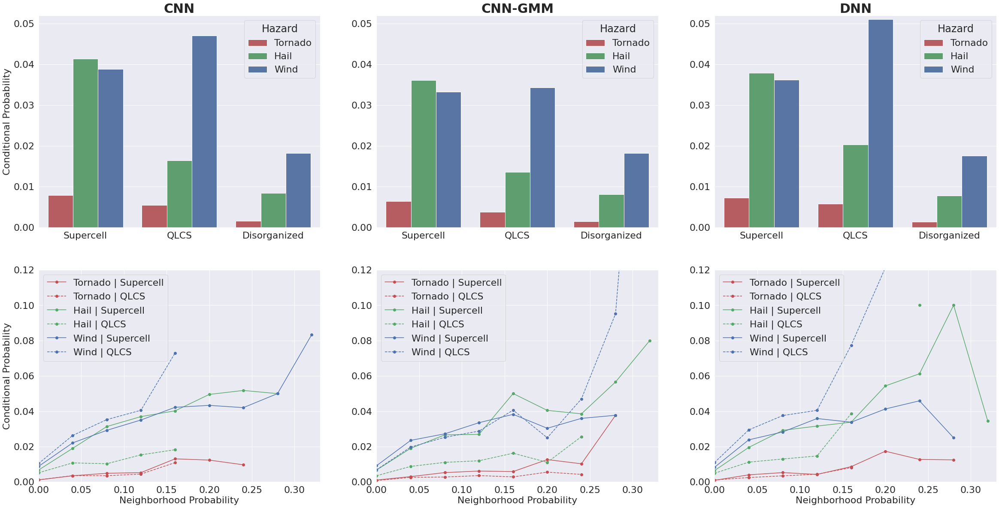

In [11]:
model_names = ['CNN', 'CNN-GMM', 'DNN', 'CNN', 'CNN-GMM', 'DNN']
model_list = ['CNN_1', 'SS', 'DNN_1', 'CNN_1', 'SS', 'DNN_1']

fig, axes = plt.subplots(2, 3, figsize=(40, 20))
for i, ax in enumerate(axes.ravel()):
    if i < 3:
        plot_total_cp(matched_obs, probs, model_list[i], neighborhood_thresh=0.1, ax=ax)
        ax.set_xlabel(None)
        ax.set_title(model_names[i], fontsize=30, weight='bold')
        if i == 0:
            ax.set_ylabel('Conditional Probability', fontsize=22)
        else:
            ax.set_ylabel(None)
    else:
        plot_rel_diagram_neighborhood(matched_obs, probs, model_list[i], 0.04, 0.33, ax=ax)
        if i == 3:
            ax.set_ylabel('Conditional Probability', fontsize=22)
        else:
            ax.set_ylabel(None)
plt.savefig('/glade/work/cbecker/HWT_val_output/cond_prob_paper_val_draft.pdf', bbox_inches='tight')

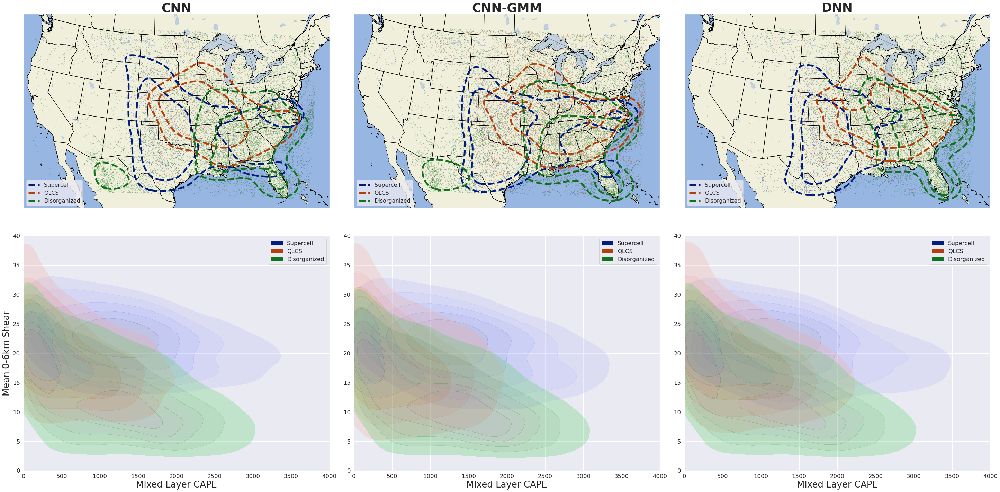

In [52]:
model_list = ['CNN_1', 'SS', 'DNN_1', 'CNN_1', 'SS', 'DNN_1']
model_names = ['CNN', 'CNN-GMM', 'DNN', 'CNN', 'CNN-GMM', 'DNN']
lcc = ccrs.LambertConformal(central_longitude=-97.5, standard_parallels=(38.5, 38.5))
fig = plt.figure(figsize=(40, 20), constrained_layout=True)


for i in range(6):
    if i < 3:
        ax = fig.add_subplot(2, 3, i+1, projection=lcc)
        plot_modes_spatial(labels, model_list[i], ax=ax)
        ax.set_xlabel(None)
        ax.set_title(model_names[i], fontsize=36, weight='bold')
    else:
        ax = fig.add_subplot(2, 3, i+1)
        plot_modes_CS(labels, model_list[i], ax=ax)
        ax.set_xlabel('Mixed Layer CAPE', fontsize=26)
        if i == 3:
            ax.set_ylabel('Mean 0-6km Shear', fontsize=26)
        else:
            ax.set_ylabel(None)
plt.savefig('/glade/work/cbecker/HWT_val_output/spatiotemporal_paper_val_draft_10000.pdf', bbox_inches='tight')

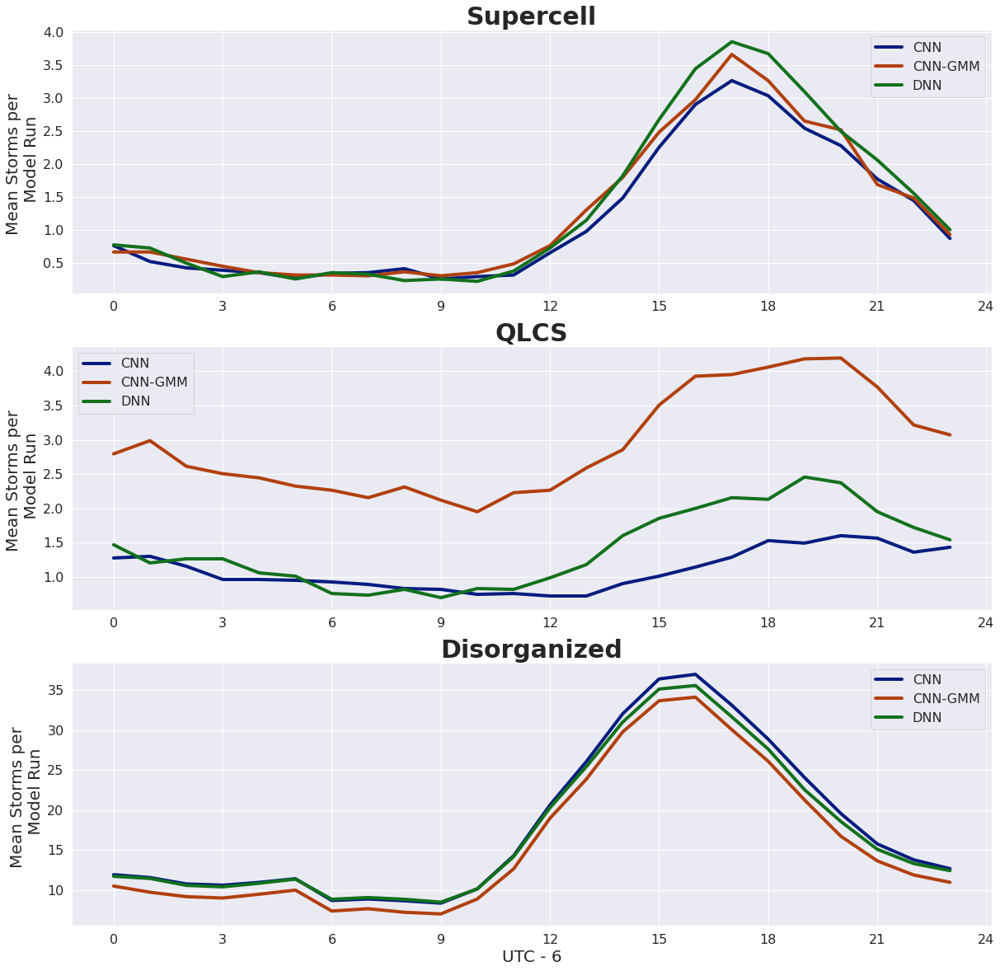

In [5]:
mode_list = ['Supercell', 'QLCS', 'Disorganized']

fig, axes = plt.subplots(3, 1, figsize=(20, 20))
for i, ax in enumerate(axes.ravel()):
    plot_modes_diurnal_r(labels, mode_list[i], ax=ax)
    ax.set_xlabel(None)
    ax.set_xticks(np.arange(0, 27, 3)) 
    # ax.set_ylim(0, 150)
    ax.set_title(mode_list[i].split('_')[0], fontsize=30, weight='bold')
    ax.set_ylabel('Mean Storms per \n Model Run', fontsize=20)
    if i == 2:
        ax.set_xlabel('UTC - 6', fontsize=20)
plt.savefig('/glade/work/cbecker/HWT_val_output/diurnal_paper_val_draft_inverse.png', dpi=300, bbox_inches='tight')

In [5]:
cols = [c for c in labels.columns if 'cluster' in c]
col_prob = labels[cols].max(axis=1)
col_label = labels[cols].idxmax(axis=1).apply(lambda x: x.split('_')[-2]).astype(int)
labels['SS_label'] = col_label
labels['SS_label_prob'] = col_prob
clusters = joblib.load("/glade/work/cbecker/HWT/HWT_models/HWT_20220318_SS/models/SS/SS_GMM_labels_charlie_2022-03-22_1636.dict")
ordered_clusters = [3, 5, 10, 20, 1, 6, 8, 12, 17, 19, 23, 0, 2, 4, 7, 9, 11, 13, 14, 15, 16, 18, 21, 22, 24]

Plotting sample storms with highest probabilities for cluster 3.
Plotting sample storms with highest probabilities for cluster 5.
Plotting sample storms with highest probabilities for cluster 10.
Plotting sample storms with highest probabilities for cluster 20.
Plotting sample storms with highest probabilities for cluster 1.
Plotting sample storms with highest probabilities for cluster 6.
Plotting sample storms with highest probabilities for cluster 8.
Plotting sample storms with highest probabilities for cluster 12.
Plotting sample storms with highest probabilities for cluster 17.
Plotting sample storms with highest probabilities for cluster 19.
Plotting sample storms with highest probabilities for cluster 23.
Plotting sample storms with highest probabilities for cluster 0.
Plotting sample storms with highest probabilities for cluster 2.
Plotting sample storms with highest probabilities for cluster 4.
Plotting sample storms with highest probabilities for cluster 7.
Plotting sample sto

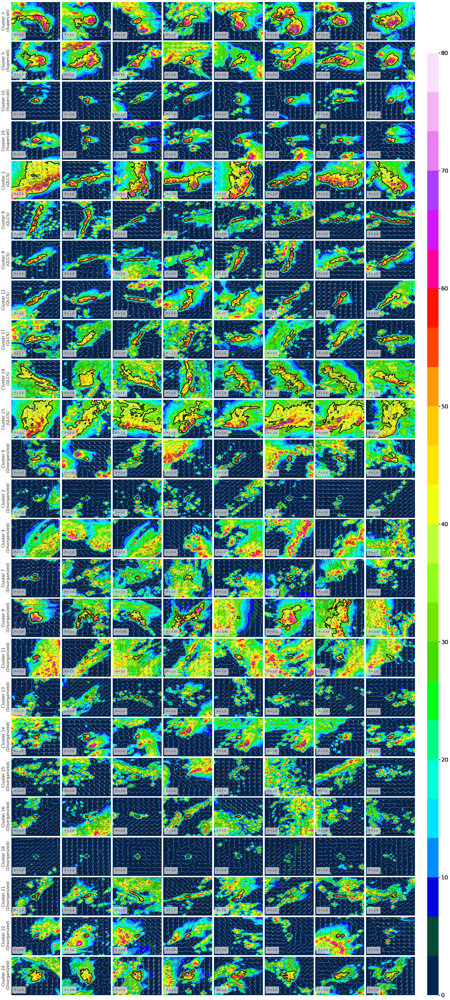

In [6]:
%%time
data_path = '/glade/work/cbecker/WRF_all/track_data_hrrr_3km_nc_refl/'
plot_storm_clusters(data_path, "", labels, n_storms=8, patch_radius=48, prob_type='highest')